In [267]:
import matplotlib.pyplot as plt;
import seaborn as sns;
from PIL import Image
from matplotlib.pyplot import imshow
%matplotlib inline  
import numpy as np;

## Image Ingest

In [268]:
def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray

## Set Healthy Kernel

In [269]:
set_kernel = True;
invert_image = False;
#im = Image.open("Data/Mar19_Manual_Run_2/29 A-549 PA cc 03.tif",mode='r')
im = Image.open("Data/Mar19_Manual_Run_2/P aeru 18hr CoCulture 2.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/No bacteria 8 hr A549 2.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/No bacteria 18hr A549 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 8 hr Coculture 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/00 A-549 PA cc 03.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/06 A549 PA cc 03.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 12hr Coculture 1.tif",mode='r');# A549 PA cc 03.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 10hr Coculture 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 14hr A549 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 18hr CoCulture 2.tif",mode="r");
#im = Image.open("Data/Mar19_Manual_Run_2/29 A-549 PA cc 03.tif",mode="r");


#im = Image.open("Data/Mar19_Manual_Run_2/SA/00 A-549 SA cc 02.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/04 A549 SA cc 02.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/06 A549 SA cc 02.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S aure 8hr A549 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S aeru 10hr CoCulture 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S areu 12hr CoCulture 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S areu 14hr CoCulture 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S aure 18hr CoCulture 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/29 A-549 SA cc 02.tif");

#imshow(np.asarray(im))
im_array = np.asarray(im,dtype=np.float32)
im_array_gray = rgb2gray(im_array);
if invert_image:
    im_array_gray = (np.abs(255.0-im_array_gray))

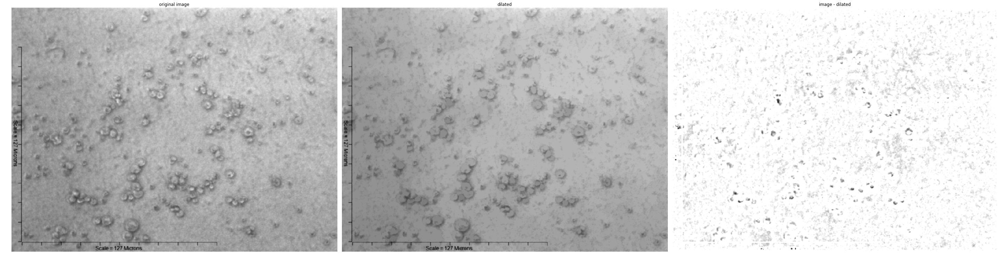

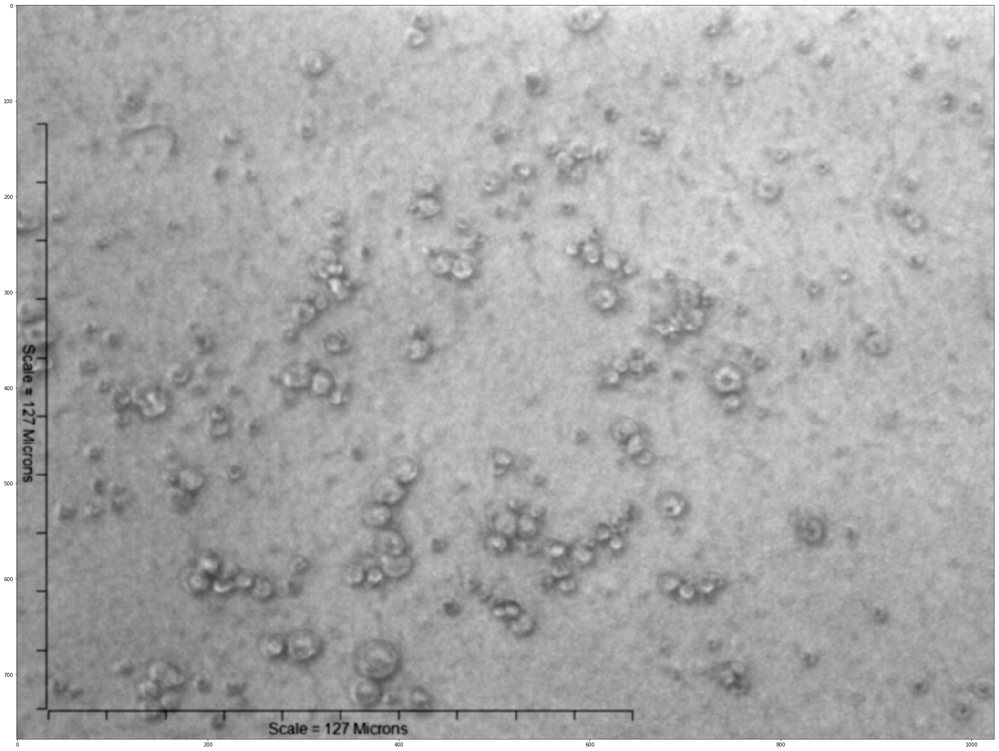

In [270]:
from scipy.ndimage import gaussian_filter
from skimage import data
from skimage import img_as_float
from skimage.morphology import reconstruction

# Convert to float: Important for subtraction later which won't work with uint8
image = img_as_float(data.coins())
image = gaussian_filter(im_array_gray, 1)

seed = np.copy(image)
seed[1:-1, 1:-1] = image.min()
mask = image

dilated = reconstruction(seed, mask, method='dilation')
im_array_gray = image;

fig, (ax0, ax1, ax2) = plt.subplots(nrows=1,
                                 ncols=3,
                                 figsize=(40, 10.5),
                                 sharex=True,
                                 sharey=True)

ax0.imshow(image, cmap='gray')
ax0.set_title('original image')
ax0.axis('off')

ax1.imshow(dilated, vmin=image.min(), vmax=image.max(), cmap='gray')
ax1.set_title('dilated')
ax1.axis('off')

ax2.imshow((dilated-image), cmap='gray')
ax2.set_title('image - dilated')
ax2.axis('off')

fig.tight_layout()

plt.figure(figsize=[35,35])
imshow(im_array_gray,cmap='gray')




## Preview Healthy Kernel

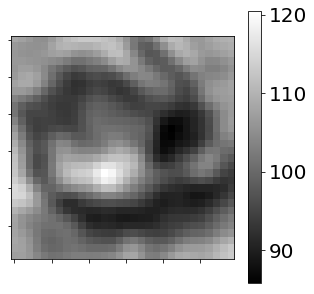

In [271]:
plt.figure(figsize=[5,5])
imshow(np.abs(im_array_gray[340:370,320:350]),cmap='gray')
ax = plt.gca()
ax.set_xticklabels({})
ax.set_yticklabels({})
#plt.setp(plt.gca().get_xticklabels(), rotation='horizontal', fontsize=40)
#plt.setp(plt.gca().get_yticklabels(), rotation='horizontal', fontsize=40)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20) 
Im_array_gray_inverse = np.abs(1.0-im_array_gray);

## Shaded Normal Kernel Extraction 

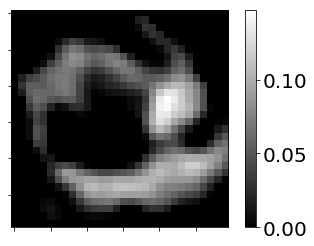

In [272]:
set_kernel=True;
if set_kernel:
    #sample_kernel = np.array(im_array_gray[275:325,750:820])  # single healthy feature

    sample_kernel = np.array(im_array_gray[340:370,320:350])  #pathogenecity feature 
    #sample_kernel = np.array(im_array_gray[190:235,590:630])  # single healthy feature

    #sample_kernel = np.array(im_array_gray[240:320,720:800])  # multiple healthy feature
    sample_kernel = (np.mean(sample_kernel,axis=None)-sample_kernel)/(np.mean(sample_kernel,axis=None))
    imshow(np.abs(sample_kernel),cmap='gray')
    #plt.hist(sample_kernel.flatten(),bins=40)


    sample_kernel[sample_kernel<0.00] =0.0; 
    mask_sample_kernel = sample_kernel;
##for row_ind in range(0,sample_kernel.shape[0]):
#    for col_ind in range(0,sample_kernel.shape[1]):
#        x = sample_kernel[row_ind][col_ind];
#        mask_sample_kernel[row_ind][col_ind] = x*(x>0.0);


#Mask_sample_kernel_inverse = np.abs(1.0-mask_sample_kernel);
    mask_sample_kernel = np.abs(mask_sample_kernel)
    imshow(mask_sample_kernel,cmap='gray')        
#Im_array_gray_inverse = np.abs(1.0-im_array_gray);

#imshow(np.abs(1.0-Mask_sample_kernel_inverse),cmap='gray')
    cbar = plt.colorbar()
    ax = plt.gca()
    ax.set_xticklabels({})
    ax.set_yticklabels({})
    cbar.ax.tick_params(labelsize=20) 

### Feature Extraction

ValueError: operands could not be broadcast together with shapes (30,30) (80,80) 

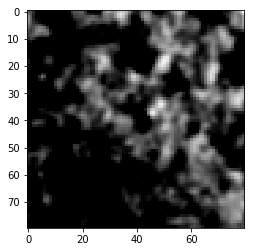

In [110]:
row_ind=20;
col_ind=20;
Raw_Subimage = np.array(im_array_gray[row_ind:row_ind+mask_rows,col_ind:col_ind+mask_cols]);
Raw_Subimage = (Raw_Subimage-np.mean(Raw_Subimage))/(np.mean(Raw_Subimage,axis=None))
Raw_Subimage[Raw_Subimage<0.0]=0.0;
#Raw_Subimage[mask_sample_kernel==0.0]=0.0;
plt.figure()
imshow(Raw_Subimage,cmap='gray')

print(np.linalg.norm(np.maximum(mask_sample_kernel-Raw_Subimage,0.0*mask_sample_kernel),'fro'))
plt.figure()
imshow(mask_sample_kernel)
plt.figure()
#imshow(mask_sample_kernel-Raw_Subimage,cmap='gray')
imshow(np.abs(mask_sample_kernel-Raw_Subimage),cmap='gray')
print(np.linalg.norm((mask_sample_kernel-Raw_Subimage),'fro'))

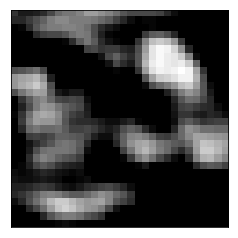

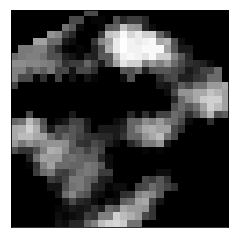

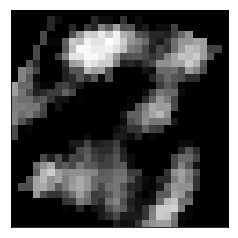

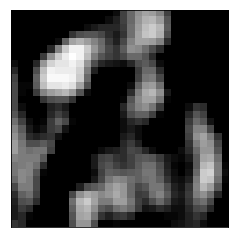

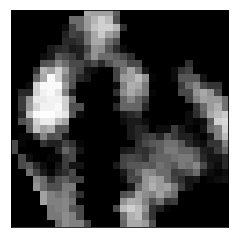

...

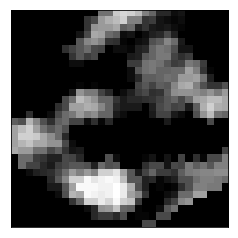

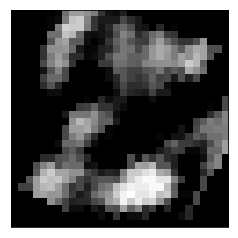

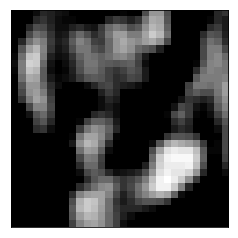

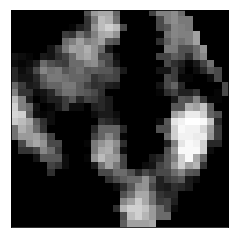

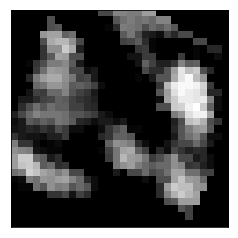

In [266]:
#imshow(mask_sample_kernel-mask_sample_kernel,cmap='gray')
#img = Image.fromarray(np.uint8(mask_sample_kernel * 255) ).rotate(angle=210)
#imshow(img)
for delta in range(base_angle,360,30):
        this_family_kernel_img= Image.fromarray(np.uint8(mask_sample_kernel * 255) ).rotate(angle=base_angle+delta)
        rotated_kernel = np.array(this_family_kernel_img,dtype=np.float32)/255.0        
        plt.figure()
        plt.xticks(ticks=[])
        plt.yticks(ticks=[])
        imshow(rotated_kernel,cmap='gray')

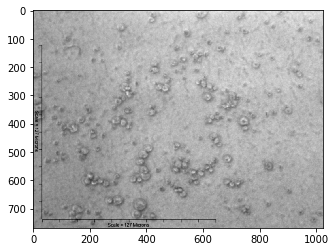

In [115]:
im_array_gray = im_array_gray/255.0


imshow(( im_array_gray-np.mean(im_array_gray))/np.mean(im_array_gray),cmap='gray')

In [35]:
im_array_gray

array([[0.71246296, 0.7117299 , 0.7096022 , ..., 0.8004364 , 0.81655866,
        0.8222987 ],
       [0.7152985 , 0.7158491 , 0.7147423 , ..., 0.80917364, 0.8237506 ,
        0.82911164],
       [0.7193885 , 0.72123724, 0.7211777 , ..., 0.8173402 , 0.82930106,
        0.83426917],
       ...,
       [0.7486828 , 0.7463928 , 0.74289715, ..., 0.78091437, 0.7923272 ,
        0.79868734],
       [0.7396251 , 0.73838514, 0.7367859 , ..., 0.7816241 , 0.794675  ,
        0.8016796 ],
       [0.73387086, 0.7336664 , 0.7330751 , ..., 0.7816515 , 0.7950174 ,
        0.80220395]], dtype=float32)

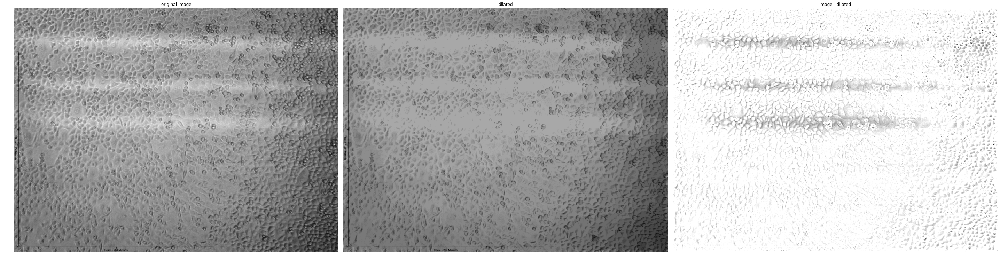

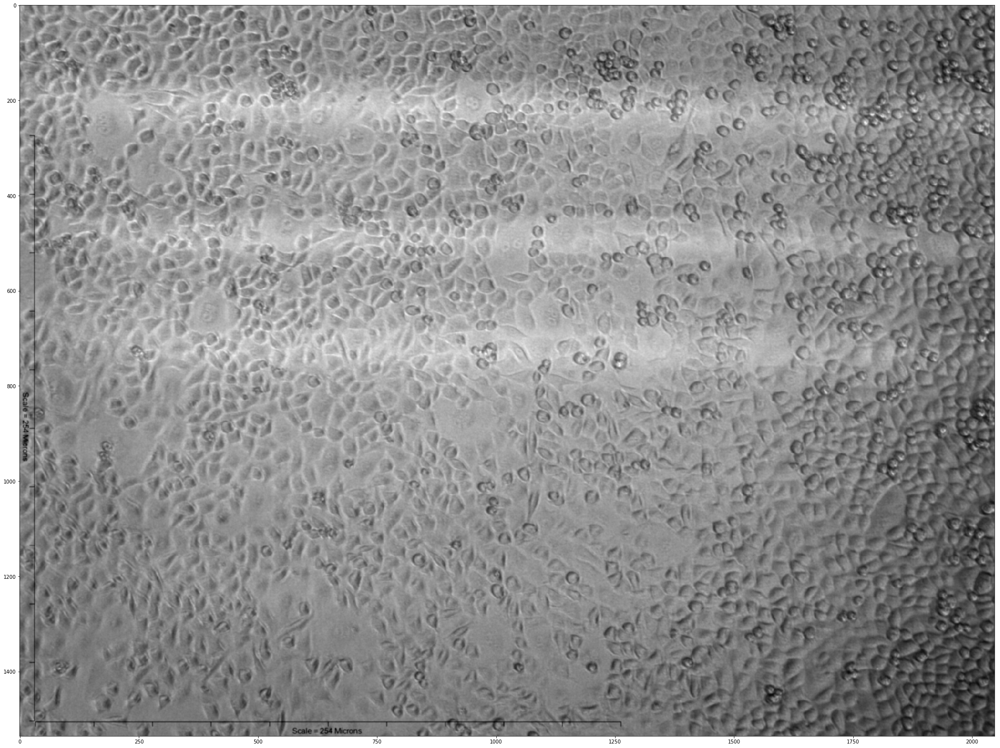

In [288]:
#Load New Image
#set_kernel = True;
invert_image = False;
#im = Image.open("Data/Mar19_Manual_Run_2/29 A-549 PA cc 03.tif",mode='r')
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 18hr CoCulture 2.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 12hr CoCulture 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/S epi 12hr Coculture 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/No bacteria 8 hr A549 2.tif",mode='r');
im = Image.open("Data/Mar19_Manual_Run_2/No bacteria 8 hr Coculture 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/No bacteria 18hr A549 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 8 hr Coculture 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/00 A-549 PA cc 03.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/06 A549 PA cc 03.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 12hr Coculture 1.tif",mode='r');# A549 PA cc 03.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 10hr Coculture 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 14hr A549 3.tif",mode='r');
#im = Image.open("Data/Mar19_Manual_Run_2/P aeru 18hr CoCulture 2.tif",mode="r");
#im = Image.open("Data/Mar19_Manual_Run_2/29 A-549 PA cc 03.tif",mode="r");


#im = Image.open("Data/Mar19_Manual_Run_2/SA/00 A-549 SA cc 02.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/04 A549 SA cc 02.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/06 A549 SA cc 02.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S aure 8hr A549 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S aeru 10hr CoCulture 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S areu 12hr CoCulture 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S areu 14hr CoCulture 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/S aure 18hr CoCulture 2.tif");
#im = Image.open("Data/Mar19_Manual_Run_2/SA/29 A-549 SA cc 02.tif");

#imshow(np.asarray(im))
im_array = np.asarray(im,dtype=np.float32)
im_array_gray = rgb2gray(im_array);
if invert_image:
    im_array_gray = (np.abs(255.0-im_array_gray))
    
from scipy.ndimage import gaussian_filter
from skimage import data
from skimage import img_as_float
from skimage.morphology import reconstruction

# Convert to float: Important for subtraction later which won't work with uint8
image = img_as_float(data.coins())
image = gaussian_filter(im_array_gray, 1)

seed = np.copy(image)
seed[1:-1, 1:-1] = image.min()
mask = image

dilated = reconstruction(seed, mask, method='dilation')
im_array_gray = image;

fig, (ax0, ax1, ax2) = plt.subplots(nrows=1,
                                 ncols=3,
                                 figsize=(40, 10.5),
                                 sharex=True,
                                 sharey=True)

ax0.imshow(image, cmap='gray')
ax0.set_title('original image')
ax0.axis('off')

ax1.imshow(dilated, vmin=image.min(), vmax=image.max(), cmap='gray')
ax1.set_title('dilated')
ax1.axis('off')

ax2.imshow((dilated-image), cmap='gray')
ax2.set_title('image - dilated')
ax2.axis('off')

fig.tight_layout()

plt.figure(figsize=[35,35])
imshow(im_array_gray,cmap='gray')






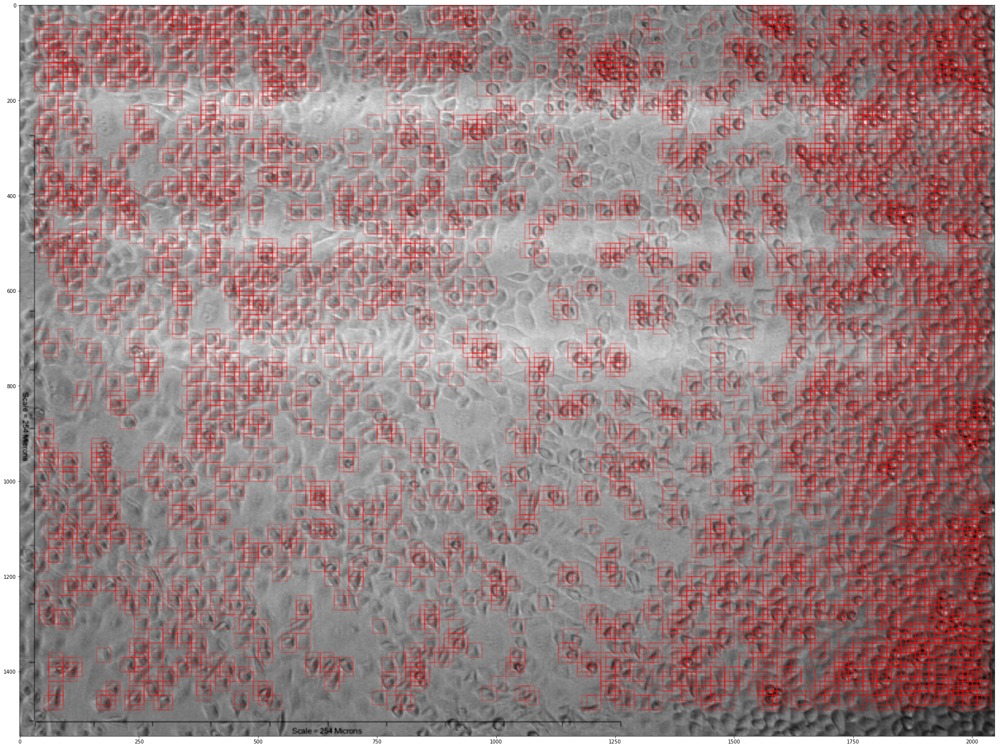

In [289]:
#im_array_gray = (np.abs(255.0-im_array_gray))
#im_array_gray = (np.abs(255.0-im_array_gray))
num_rows = im_array_gray.shape[0];
num_cols = im_array_gray.shape[1];
mask_rows = sample_kernel.shape[0]
mask_cols = sample_kernel.shape[1];
import matplotlib.patches as patches


#norm_alpha = 1.65; for healthy cell clusters 
norm_alpha=1.235;
all_norms = [];
all_rotated_norms = [];
all_rects = [];
Raw_Subimage_Count = 0;
for row_ind in np.arange(0,num_rows-mask_rows-50,10):
    for col_ind in np.arange(mask_cols,num_cols-mask_cols,10):
        #if row_ind%100==0:
        #    if col_ind%100==0:
        #        print(repr(row_ind) + ',' +repr(col_ind))
        Raw_Subimage = np.array(im_array_gray[row_ind:row_ind+mask_rows,col_ind:col_ind+mask_cols]);
        Raw_Subimage = (np.mean(Raw_Subimage,axis=None)-Raw_Subimage)/(np.mean(Raw_Subimage,axis=None))
        Raw_Subimage[Raw_Subimage<0.0]=0.0;
        

        #Family of Kernel Processing Layer
        base_angle = 0;
        rotated_norms = [];
        for delta in range(base_angle,360,360):
            this_family_kernel_img= Image.fromarray(np.uint8(mask_sample_kernel * 255) ).rotate(angle=base_angle+delta)
            rotated_kernel = np.array(this_family_kernel_img,dtype=np.float32)/255.0        
            temp_filtered_image = np.array(Raw_Subimage);
            temp_filtered_image[rotated_kernel==0.0]=0.0;
            this_norm = np.linalg.norm(rotated_kernel*temp_filtered_image-rotated_kernel,'fro')
            rotated_norms.append(this_norm);
        all_rotated_norms.append(rotated_norms);
        #Comparison 
        
        #dist_image =mask_sample_kernel-temp_filtered_image;
        #imshow(prod_image,cmap='gray')
        #if norm_alpha>this_norm:
            #this_rect = patches.Rectangle((0,0),10,10,linewidth=3,edgecolor='g',facecolor='none',alpha=1.0);
            #plt.savefig('All_Filtered_Images/'+ 'R' + repr(row_ind) + 'C'+ repr(col_ind)+'.png')
        
        #this_norm= np.linalg.norm(temp_filtered_image,'fro');
        #this_norm = np.linalg.norm(Raw_Subimage_Gated_Inverse,'fro')
        all_norms.append(np.min(rotated_norms));#[this_norm,col_ind,row_ind]);
        
        if norm_alpha>np.min(rotated_norms):#0.06<this_norm:                       
            this_rect = patches.Rectangle((col_ind,row_ind),mask_cols,mask_rows,linewidth=3,edgecolor='r',facecolor='none',alpha=0.2);
            all_rects.append(this_rect);
            #plt.savefig('/Users/yeun666/Documents/FoFProcessedImages/Movies/Mar19/SubImage_' + repr(Raw_Subimage_Count) + '.jpg',dpi=500,format='jpeg')
            
        #Raw_Subimage_Count +=1; 
        
plt.figure(figsize=(35,35));        
imshow(im_array_gray,cmap='gray')
ax = plt.gca();
for rect in all_rects:
    ax.add_patch(rect)
plt.show()
            



Text(0.5, 0, 'Frobenius Norm of Convolution w/ P-Feature ')

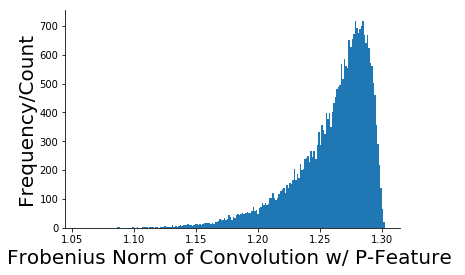

In [290]:
plt.hist(all_norms,bins=200);

#plt.xlim([1.4,2.5])
#plt.ylim([0.0,50])
ax = plt.gca()

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.ylabel('Frequency/Count',size=20)
plt.xlabel('Frobenius Norm of Convolution w/ P-Feature ',size=20)